<a href="https://colab.research.google.com/github/Loperaa-Juan/CNN_Malaria/blob/main/Proyecto_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [38]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# **DESCARGUEMOS EL DATASET DE MALARIA**

In [39]:
datos, metadatos = tfds.load('malaria', as_supervised=True, with_info=True)

In [40]:
metadatos

tfds.core.DatasetInfo(
    name='malaria',
    full_name='malaria/1.0.0',
    description="""
    The Malaria dataset contains a total of 27,558 cell images with equal instances
    of parasitized and uninfected cells from the thin blood smear slide images of
    segmented cells.
    """,
    homepage='https://lhncbc.nlm.nih.gov/publication/pub9932',
    data_dir='/root/tensorflow_datasets/malaria/1.0.0',
    file_format=tfrecord,
    download_size=337.08 MiB,
    dataset_size=317.62 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'train': <SplitInfo num_examples=27558, num_shards=4>,
    },
    citation="""@article{rajaraman2018pre,
      title={Pre-trained convolutional neural networks as feature extractors toward
      improved malaria parasit

## **EXPLOREMOS LOS DATOS DEL DATASET**

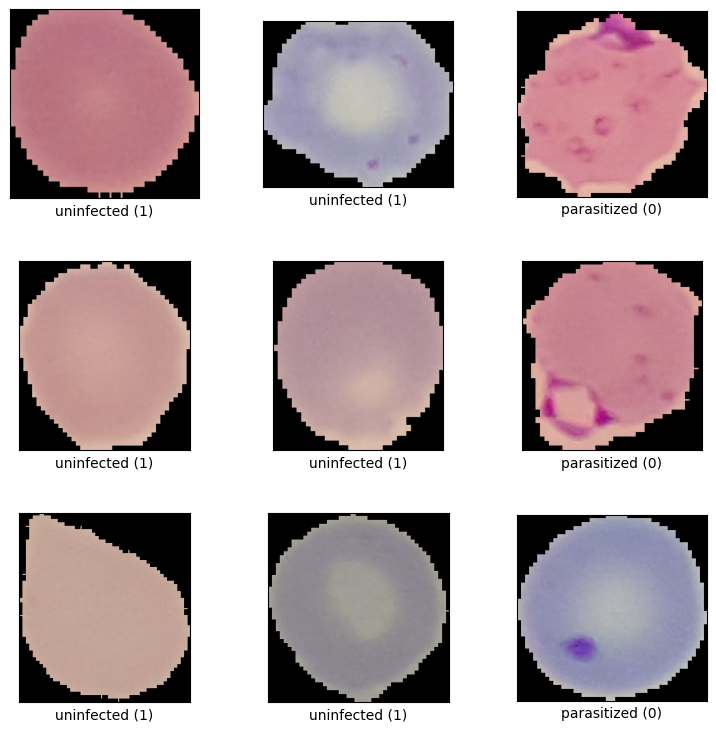

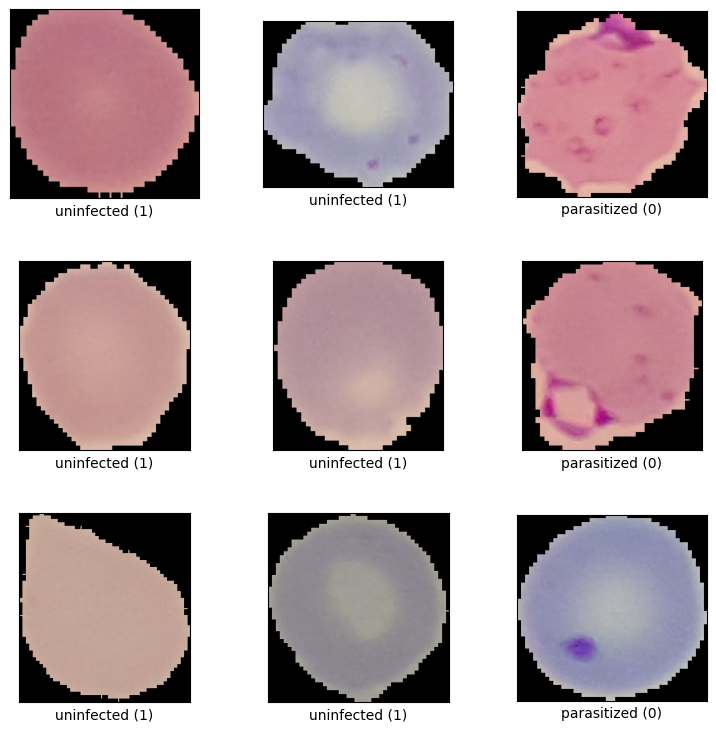

In [41]:
tfds.show_examples(datos['train'], metadatos)

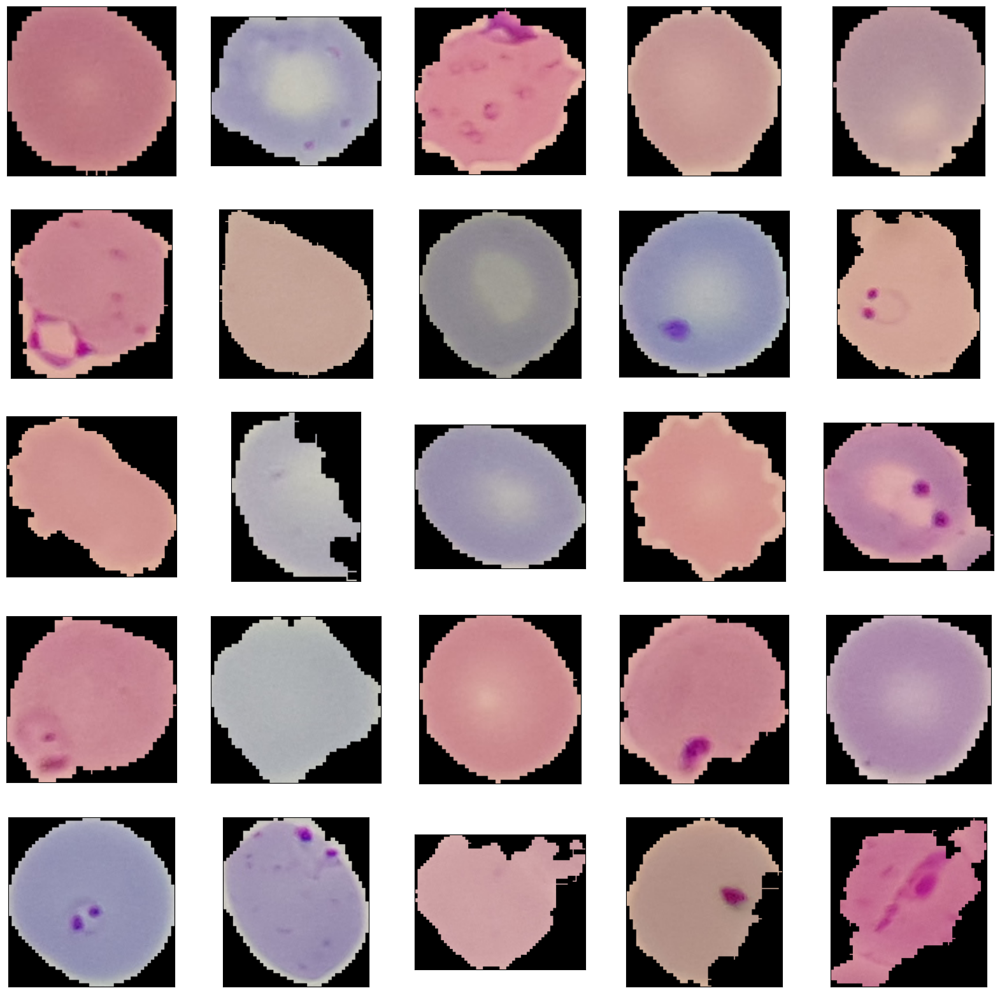

In [42]:
plt.figure(figsize=(20,20))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

# **PROBLEMA**

Como podemos ver, no todas las imagenes son de igual tamaño. Considerando que estas entrarán en una red neuronal, debemos hacer transformaciones

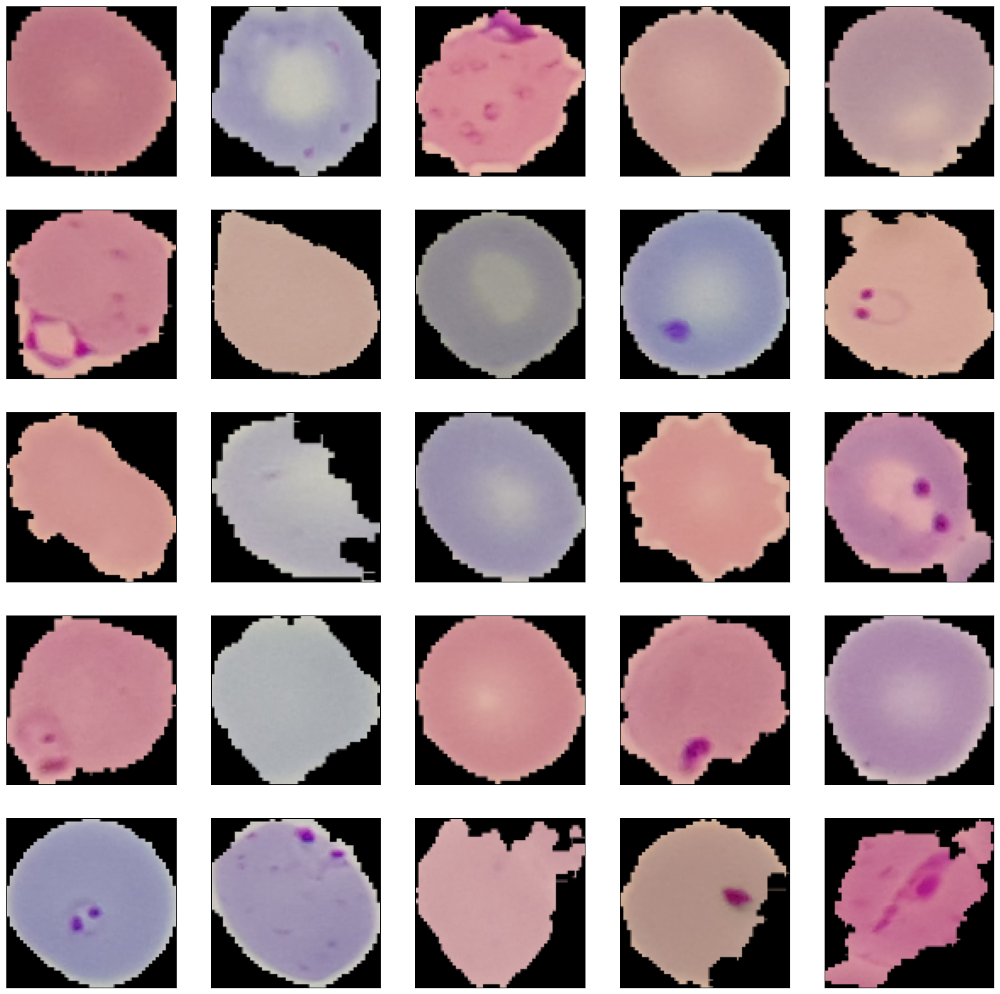

In [43]:
import cv2

plt.figure(figsize=(20,20))

SIZE_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (SIZE_IMG, SIZE_IMG))
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

Las imagenes ahora tienen un tamaño (100, 100, 3), osea que tenemos una imagen de 100x100 con tres canales de color. Esto puede suponer una complejidad extra a la hora de entrenar nuestra CNN. Pasemos el dataset a Blanco y Negro

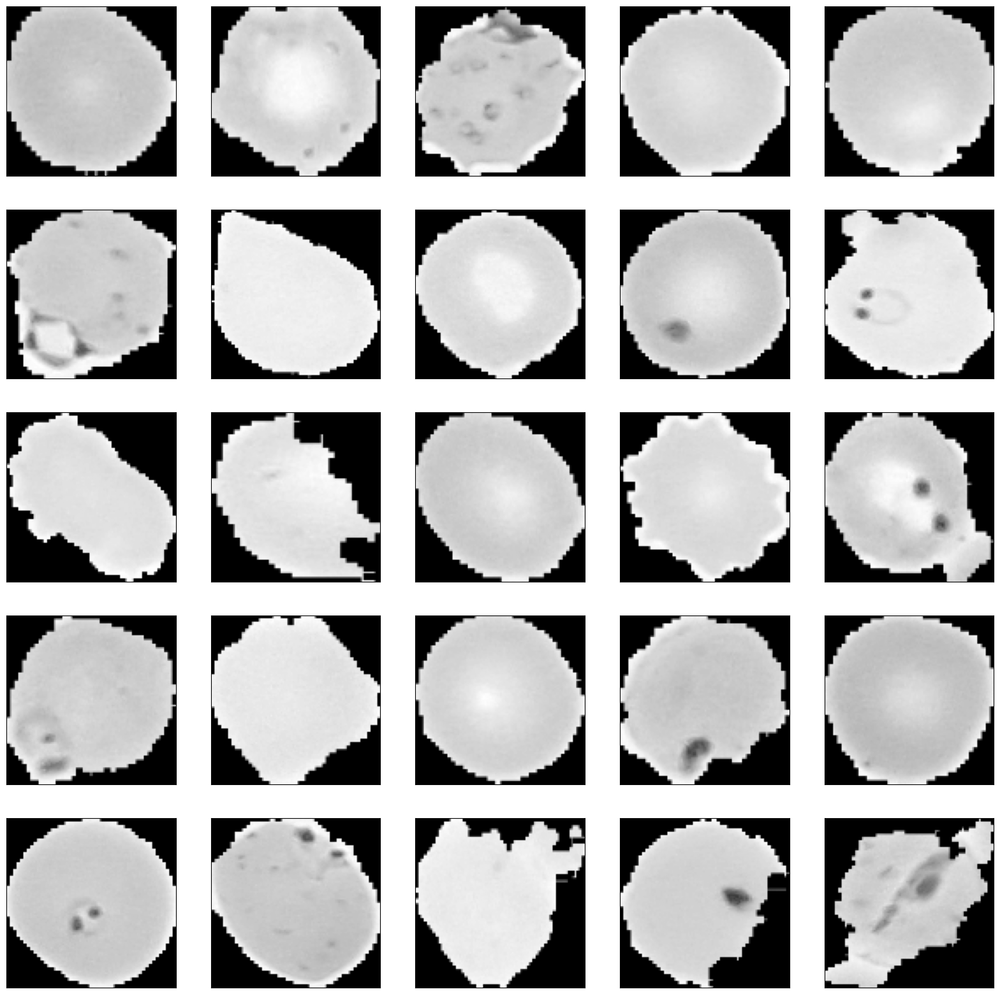

In [44]:
plt.figure(figsize=(20,20))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (SIZE_IMG, SIZE_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')

# **DEFINAMOS NUESTROS DATOS DE ENTRENAMIENTO**

In [45]:
datos_entrenamiento = []

In [46]:
for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (SIZE_IMG, SIZE_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(SIZE_IMG, SIZE_IMG, 1)
  datos_entrenamiento.append([imagen, etiqueta])

In [244]:
# print(datos_entrenamiento[0])

In [48]:
len(datos_entrenamiento)

27558

# **SEPAREMOS X y Y**

In [245]:
X = [] # Pixeles de las imagenes
Y = [] # Etiquetas (0 <- Infectado y 1 <- Parasitado)

In [50]:
for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  Y.append(etiqueta)

In [246]:
# for i in X[1]:
#   print(i)

In [247]:
import numpy as np

X = np.array(X).astype(float) / 255

In [56]:
Y

array([1, 1, 0, ..., 1, 1, 0])

In [55]:
Y = np.array(Y)
Y

array([1, 1, 0, ..., 1, 1, 0])

In [57]:
X.shape

(27558, 100, 100, 1)

# **CREEMOS LAS REDES NEURONALES CONVOLUCIONALES**

In [58]:
tf.keras.backend.clear_session()

modeloCNN_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

tf.keras.backend.clear_session()

modeloCNN_2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## **PROCEDEMOS A COMPILAR Y VER SU ESTRUCTURA**

In [59]:
modeloCNN_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
modeloCNN_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [60]:
modeloCNN_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 250)            │     3,200,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           251 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,293,173 (12.56 MB)

 Trainable params: 3,293,173 (12.56 MB)

 Non-trainable params: 0 (0.00 B)

In [61]:
modeloCNN_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │     1,280,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,372,873 (5.24 MB)

 Trainable params: 1,372,873 (5.24 MB)

 Non-trainable params: 0 (0.00 B)

# **USEMOS TENSORBORAD PARA DARLE SEGUIMIENTO AL ENTRENAMIENTO**

In [62]:
from tensorflow.keras.callbacks import TensorBoard

## **ENTRENAMOS LOS MODELOS**

In [63]:
tensorboardCNN1 = TensorBoard(log_dir='logs/CNN1')
modeloCNN_1.fit(X,
                Y,
                batch_size=32,
                validation_split=0.25,
                epochs=100,
                callbacks=[tensorboardCNN1])

Epoch 1/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.6234 - loss: 0.5998 - val_accuracy: 0.9412 - val_loss: 0.1717
Epoch 2/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9411 - loss: 0.1631 - val_accuracy: 0.9486 - val_loss: 0.1528
Epoch 3/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9503 - loss: 0.1385 - val_accuracy: 0.9421 - val_loss: 0.1589
Epoch 4/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9546 - loss: 0.1225 - val_accuracy: 0.9509 - val_loss: 0.1432
Epoch 5/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9621 - loss: 0.1074 - val_accuracy: 0.9515 - val_loss: 0.1472
Epoch 6/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9647 - loss: 0.0964 - val_accuracy: 0.9489 - val_loss: 0.1632
Epoch 7/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9695 - loss: 0.0827 - val_accuracy: 0.9509 - val_loss: 0.1691
Epoch 8/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9751 - loss: 0.0688 - val_accu

In [64]:
tensorboardCNN2 = TensorBoard(log_dir='logs/CNN2')
modeloCNN_2.fit(X,
                Y,
                batch_size=32,
                validation_split=0.25,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.6261 - loss: 0.6209 - val_accuracy: 0.9406 - val_loss: 0.2082
Epoch 2/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9347 - loss: 0.1958 - val_accuracy: 0.9464 - val_loss: 0.1619
Epoch 3/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9439 - loss: 0.1593 - val_accuracy: 0.9498 - val_loss: 0.1530
Epoch 4/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9490 - loss: 0.1480 - val_accuracy: 0.9505 - val_loss: 0.1513
Epoch 5/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9542 - loss: 0.1309 - val_accuracy: 0.9504 - val_loss: 0.1421
Epoch 6/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9505 - loss: 0.1361 - val_accuracy: 0.9528 - val_loss: 0.1439
Epoch 7/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9538 - loss: 0.1257 - val_accuracy: 0.9525 - val_loss: 0.1412
Epoch 8/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9592 - loss: 0.1137 - val_acc

## **VEAMOS EL ENTRENAMIENTO A FONDO**

Con los siguientes comandos cargamos la extensión de tensorboard y lanzamos el tablero de este

In [75]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [76]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# **HAGAMOS UN AUMENTO DE DATOS**

Ya vimos el rendimiento de la red sin aumento de datos, hagamos algunas transformaciones y entrenemos nuevos modelos.

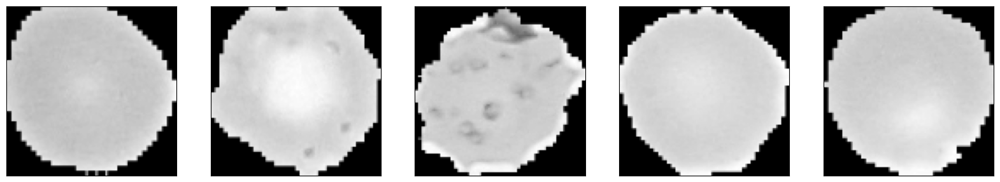

In [65]:
plt.figure(figsize=(20,20))

for i in range(5):
  plt.subplot(1,5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100,100), cmap='gray')

In [66]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    height_shift_range=0.2,
    width_shift_range=0.2,
    shear_range=15,
    zoom_range =[0.7, 1.4],
    vertical_flip=True,
    horizontal_flip=True
)

datagen.fit(X)

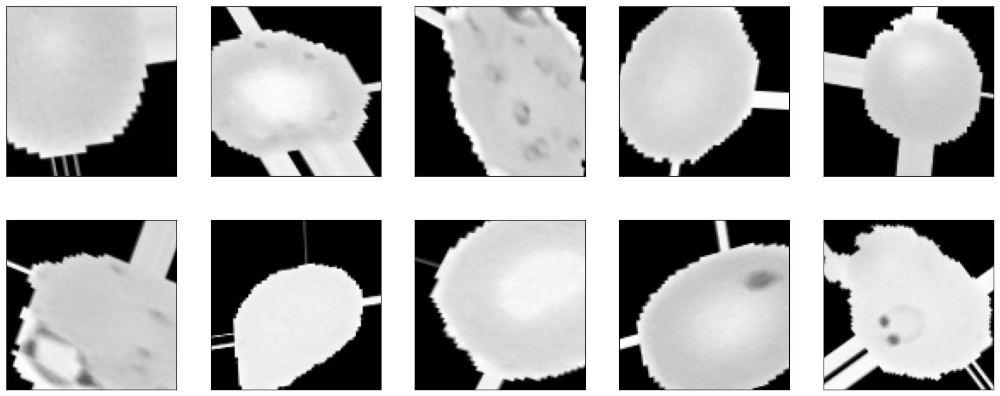

In [67]:
plt.figure(figsize=(20, 8))

# Obtener un solo batch del generador
for imagenes, etiquetas in datagen.flow(X, Y, batch_size=10, shuffle=False):
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(imagenes[i].reshape(100, 100), cmap="gray")
    break

## **CREAMOS Y ENTRENAMOS LOS NUEVOS MODELOS CON AUMENTO DE DATOS**

In [68]:
tf.keras.backend.clear_session()

modeloCNN_1_DA = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

tf.keras.backend.clear_session()

modeloCNN_2_DA = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [69]:
modeloCNN_2_DA.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
modeloCNN_1_DA.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

Separemos los datos en un 75% para entrenamiento y 25% para testing

In [70]:
print(len(X) * .75)
print(len(X) - 23424)

X_entrenamiento = X[:20668]
X_validacion = X[20668:]


Y_entrenamiento = Y[:20668]
Y_validacion = Y[20668:]

20668.5
4134


In [71]:
datos_generador = datagen.flow(X_entrenamiento, Y_entrenamiento, batch_size=32)

In [72]:
tensorboardCNN2_DA = TensorBoard(log_dir='logs/CNN2_DA')

modeloCNN_2_DA.fit(
    datos_generador,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, Y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_DA]
)

Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


646/646 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - accuracy: 0.5198 - loss: 0.6961 - val_accuracy: 0.6118 - val_loss: 0.6799
Epoch 2/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.5874 - loss: 0.6653 - val_accuracy: 0.9123 - val_loss: 0.2692
Epoch 3/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.8650 - loss: 0.3474 - val_accuracy: 0.9402 - val_loss: 0.1989
Epoch 4/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.8895 - loss: 0.2910 - val_accuracy: 0.9163 - val_loss: 0.2308
Epoch 5/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.8954 - loss: 0.2882 - val_accuracy: 0.9315 - val_loss: 0.2083
Epoch 6/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.9001 - loss: 0.2672 - val_accuracy: 0.9388 - val_loss: 0.1862
Epoch 7/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.9007 - loss: 0.2708 - val_accuracy: 0.9399 - val_loss: 0.1790
Epoch 8/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.9011 - loss: 0.2647 - val_

In [73]:
import gc
gc.collect()

744

In [74]:
tensorboardCNN1_DA = TensorBoard(log_dir='logs/CNN1_DA')

modeloCNN_1_DA.fit(
    datos_generador,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, Y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN1_DA]
)

Epoch 1/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5018 - loss: 0.6955 - val_accuracy: 0.4949 - val_loss: 0.6932
Epoch 2/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.5021 - loss: 0.6932 - val_accuracy: 0.4949 - val_loss: 0.6932
Epoch 3/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.4976 - loss: 0.6932 - val_accuracy: 0.4949 - val_loss: 0.6933
Epoch 4/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.5063 - loss: 0.6931 - val_accuracy: 0.4949 - val_loss: 0.6932
Epoch 5/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.4933 - loss: 0.6932 - val_accuracy: 0.4949 - val_loss: 0.6932
Epoch 6/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.5027 - loss: 0.6932 - val_accuracy: 0.4949 - val_loss: 0.6933
Epoch 7/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.4961 - loss: 0.6932 - val_accuracy: 0.4949 - val_loss: 0.6932
Epoch 8/100
646/646 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.5032 - loss: 0

# **HAGAMOS UNA PREDICCIÓN**

In [114]:
X[22000]

Y[22000]

np.int64(1)

Como podemos ver la celula no está infectada con malaria

In [116]:
predict = X[22000].reshape(100,100, 1)
predict = np.expand_dims(predict, axis=0)
prediction = modeloCNN_2_DA.predict(predict)

if prediction > 0.5:
  print('Celula sana')
else:
  print('Celula infectada con malaria')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Celula sana


Funciona Bien! Ahora vamos a incluir una funcionalidad que amplie la capacidad de este proyecto.

En este caso usaremos `google/medgemma-4b-it` desplegado en **Hugging Face Inference Endpoints**, le pasaremos la imagen a la cual se le hizo la predicción con la CNN y le pediremos que nos explique el porqué del dictamen dado por la red neuronal.

**google/medgemma-4b-it:** Es un modelo de inteligencia artificial creado por Google Research que pertenece a la familia Gemma, pero adaptado específicamente para el ámbito biomédico. MedGemma está diseñado para trabajar con información tanto visual como textual, lo que lo convierte en un modelo multimodal capaz de analizar imágenes médicas y comprender instrucciones en lenguaje natural al mismo tiempo. Está pensado para tareas como la descripción de hallazgos clínicos, el análisis de imágenes microscópicas, radiológicas o dermatológicas, y la generación automática de reportes médicos. Su entrenamiento está basado en grandes colecciones de datos biomédicos, lo que lo hace especialmente competente en interpretar patrones relevantes en el contexto de la medicina.

Instalemos `openai` para comunicarnos con nuestro endpoint

In [103]:
!pip install openai

Por motivos de seguridad, utilizo variables de entorno para el token de hugging face y el inference endpoint

In [143]:
from dotenv import load_dotenv

load_dotenv()

from google.colab import userdata
api_key = userdata.get('HF_TOKEN')
inference_endpoint = userdata.get('INFERENCE_ENDPOINT')

Para usar tanto la CNN como el Endpoint de inferencia debemos crear una función que logre:

- Transformar la imagen a Blanco y Negro
- Pasar esta misma imagen a base64
- Hacer la predicción con nuestra CNN
- Pasar el prompt y la imagen al inference endpoint

In [255]:
from openai import OpenAI
import base64
from termcolor import colored

client = OpenAI(
	base_url = inference_endpoint,
	api_key = api_key
)

def malaria_predict(imagen):
  imagen = cv2.resize(imagen.numpy(), (SIZE_IMG, SIZE_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(SIZE_IMG, SIZE_IMG, 1)
  img_uint8 = imagen.astype(np.uint8)
  img_uint8 = img_uint8.reshape(SIZE_IMG, SIZE_IMG)
  _, buffer = cv2.imencode('.png', img_uint8)

  img_base64 = base64.b64encode(buffer).decode('utf-8')

  predict = np.expand_dims(imagen, axis=0) / 255
  prediction = modeloCNN_2_DA.predict(predict)

  if prediction > 0.5:
    print(colored("Celula sana\n", "green"))
    prompt = '''La imagen que ves es una celula que no estáinfectada con malaria. Analiza la imagen cuidadosamente y describe con detalle todas las características
    visuales importantes que observes: colores, texturas, patrones, forma, tamaño, anomalías, estructuras visibles y cualquier indicio de infección o alteración celular.
    Explica qué elementos de la imagen te llevan a esas conclusiones.
    '''
  else:
    print(colored("Celula infectada con malaria\n", "red"))
    prompt = '''La imagen que ves es una celula infectada con malaria. Analiza la imagen cuidadosamente y describe con detalle todas las características visuales
    importantes que observes: colores, texturas, patrones, forma, tamaño, anomalías, estructuras visibles y cualquier indicio de infección o alteración celular.
    Explica qué elementos de la imagen te llevan a esas conclusiones.'''


  chat_completion = client.chat.completions.create(
	  model = "google/medgemma-4b-it",
	  messages = [
	  	{
	  		"role": "user",
	  		"content": [
	  			{
	  				"type": "image_url",
	  				"image_url": {
	  					"url": f"data:image/png;base64,{img_base64}"
	  				}
	  			},
	  			{
	  				"type": "text",
	  				"text": prompt
	  			}
	  		]
	  	}
	  ],
	  stream = True,
	  max_tokens = 1000
  )

  for message in chat_completion:
  	print(message.choices[0].delta.content, end = "")

# **PROBEMOS EL FUNCIONAMIENTO DE TODO EL PROYECTO**

In [270]:
N = 22561
for imagen, etiqueta in datos['train'].skip(N).take(1):
    dato = imagen
    target = etiqueta

In [271]:
target # Está infectada con malaria

<tf.Tensor: shape=(), dtype=int64, numpy=0>

In [272]:
malaria_predict(dato)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Celula infectada con malaria

Basándome en la imagen proporcionada, aquí hay un análisis detallado:

**Características visuales generales:**

*   **Color:** Predominantemente blanco (o muy claro). Este color sugiere que la imagen es una radiografía o tomografía que muestra una estructura con alta densidad.
*   **Forma:** Circular. Esta forma concéntrica y perfecta es muy indicativa de una estructura estructural, como una célula o un órgano, en un entorno específico como una radiografía.
*   **Tamaño:** La imagen está pixelizada y no revelan las dimensiones exactas. Sin embargo, se observa una estructura de tamaño considerable comparada con el "fondo blanco", lo que sugiere que estamos viendo una entidad de tamaño mediano o grande, del que se pueden inferir esclavaturas a instancias de malaria.

**Anomalías y estructuras visibles:**

*   **"Asterisco" (o estructura similar):** En el centro de la imagen existe una estructura que se asemeja a un "aste